In [155]:
import numpy as np
import pandas as pd
%matplotlib inline 
import seaborn as sns
from matplotlib import pyplot as plt
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OrdinalEncoder
import sklearn.model_selection as ms
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import StratifiedShuffleSplit

housing = pd.read_csv('./housing_fill_drop1.csv', index_col=0)
housing.shape
housing 

,PID,GrLivArea,SalePrice,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,Fence,MiscVal,MoSold,YrSold,SaleType,SaleCondition
1,909176150,856,126000,30,RL,59.0,7890,Pave,Naa,Reg,Lvl,AllPub,Corner,Gtl,SWISU,Norm,Norm,1Fam,1Story,6,6,1939,1950,Gable,CompShg,Wd Sdng,Wd Sdng,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,238.0,Unf,0.0,618.0,856.0,GasA,TA,Y,SBrkr,856,0,0,1.0,0.0,1,0,2,1,TA,4,Typ,1,Gd,Detchd,1939.0,Unf,2.0,399.0,TA,TA,Y,0,0,0,0,166,0,Nf,0,3,2010,WD,Normal
2,905476230,1049,139500,120,RL,42.0,4235,Pave,Naa,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,TwnhsE,1Story,5,5,1984,1984,Gable,CompShg,HdBoard,HdBoard,BrkFace,149.0,Gd,TA,CBlock,Gd,TA,Mn,GLQ,552.0,ALQ,393.0,104.0,1049.0,GasA,TA,Y,SBrkr,1049,0,0,1.0,0.0,2,0,2,1,Gd,5,Typ,0,Nfp,Attchd,1984.0,Fin,1.0,266.0,TA,TA,Y,0,105,0,0,0,0,Nf,0,2,2009,WD,Normal
3,911128020,1001,124900,30,C (all),60.0,6060,Pave,Naa,Reg,Lvl,AllPub,Inside,Gtl,IDOTRR,Norm,Norm,1Fam,1Story,5,9,1930,2007,Hip,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,BrkTil,TA,TA,No,ALQ,737.0,Unf,0.0,100.0,837.0,GasA,Ex,Y,SBrkr,1001,0,0,0.0,0.0,1,0,2,1,Gd,5,Typ,0,Nfp,Detchd,1930.0,Unf,1.0,216.0,TA,Po,N,154,0,42,86,0,0,Nf,0,11,2007,WD,Normal
4,535377150,1039,114000,70,RL,80.0,8146,Pave,Naa,Reg,Lvl,AllPub,Corner,Gtl,OldTown,Norm,Norm,1Fam,2Story,4,8,1900,2003,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,Gd,BrkTil,Fa,TA,No,Unf,0.0,Unf,0.0,405.0,405.0,GasA,Gd,Y,SBrkr,717,322,0,0.0,0.0,1,0,2,1,TA,6,Typ,0,Nfp,Detchd,1940.0,Unf,1.0,281.0,TA,TA,N,0,0,168,0,111,0,Nf,0,5,2009,WD,Normal
5,534177230,1665,227000,60,RL,70.0,8400,Pave,Naa,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,2Story,8,6,2001,2001,Gable,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,No,GLQ,643.0,Unf,0.0,167.0,810.0,GasA,Ex,Y,SBrkr,810,855,0,1.0,0.0,2,1,3,1,Gd,6,Typ,0,Nfp,Attchd,2001.0,Fin,2.0,528.0,TA,TA,Y,0,45,0,0,0,0,Nf,0,11,2009,WD,Normal
6,908128060,1922,198500,85,RL,64.0,7301,Pave,Naa,Reg,Lvl,AllPub,Corner,Gtl,Edwards,Norm,Norm,1Fam,SFoyer,7,5,2003,2003,Gable,CompShg,HdBoard,HdBoard,BrkFace,500.0,Gd,TA,Slab,Nb,Nb,Nb,Nb,0.0,Nb,0.0,0.0,0.0,GasA,Ex,Y,SBrkr,495,1427,0,0.0,0.0,3,0,4,1,Gd,7,Typ,1,Ex,BuiltIn,2003.0,RFn,2.0,672.0,TA,TA,Y,0,0,177,0,0,0,Nf,0,7,2009,ConLD,Normal
7,902135020,936,93000,20,RM,60.0,6000,Pave,Pave,Reg,Bnk,AllPub,Inside,Mod,OldTown,Norm,Norm,2fmCon,1Story,4,4,1953,1953,Gable,CompShg,MetalSd,MetalSd,None,0.0,Fa,TA,CBlock,Fa,TA,No,Unf,0.0,Unf,0.0,936.0,936.0,GasA,TA,N,SBrkr,936,0,0,0.0,0.0,1,0,2,1,TA,4,Min2,0,Nfp,Detchd,1974.0,Unf,2.0,576.0,TA,TA,Y,0,32,112,0,0,0,Nf,0,2,2009,WD,Normal
8,528228540,1246,187687,20,RL,53.0,3710,Pave,Naa,Reg,Lvl,AllPub,Inside,Gtl,Blmngtn,Norm,Norm,1Fam,1Story,7,5,2007,2008,Gable,CompShg,WdShing,Wd Shng,BrkFace,20.0,Gd,TA,PConc,Gd,TA,Gd,Unf,0.0,Unf,0.0,1146.0,1146.0,GasA,Ex,Y,SBrkr,1246,0,0,0.0,0.0,2,0,2,1,Gd,5,Typ,1,Gd,Attchd,2007.0,Fin,2.0,428.0,TA,TA,Y,100,24,0,0,0,0,Nf,0,3,2008,New,Partial
9,923426010,889,137500,20,RL,74.0,12395,Pave,Naa,Reg,Lvl,AllPub,Corner,Gtl,Mitchel,Norm,Norm,1Fam,1Story,5,6,1984,1984,Gable,CompShg,HdBoard,Plywood,None,0.0,TA,TA,CBlock,TA,TA,No,ALQ,647.0,Unf,0.0,217.0,864.0,GasA,TA,Y,SBrkr,889,0,0,0.0,0.0,1,0,3,1,TA,6,Typ,0,Nfp,Attchd,1984.0,Unf,2.0,484.0,TA,TA,Y,0,0,0,0,0,0,Nf,0,4,2008,WD,Normal
10,908186050,1072,140000,180,RM,35.0,3675,Pave,Naa,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,TwnhsE,SFoye

In [156]:
pd.set_option('display.max_rows', housing.shape[0]+1)

housing.isna().sum()

PID               0
GrLivArea         0
SalePrice         0
MSSubClass        0
MSZoning          0
LotFrontage       0
LotArea           0
Street            0
Alley             0
LotShape          0
LandContour       0
Utilities         0
LotConfig         0
LandSlope         0
Neighborhood      0
Condition1        0
Condition2        0
BldgType          0
HouseStyle        0
OverallQual       0
OverallCond       0
YearBuilt         0
YearRemodAdd      0
RoofStyle         0
RoofMatl          0
Exterior1st       0
Exterior2nd       0
MasVnrType       14
MasVnrArea        0
ExterQual         0
ExterCond         0
Foundation        0
BsmtQual          0
BsmtCond          0
BsmtExposure      0
BsmtFinType1      0
BsmtFinSF1        0
BsmtFinType2      0
BsmtFinSF2        0
BsmtUnfSF         0
TotalBsmtSF       0
Heating           0
HeatingQC         0
CentralAir        0
Electrical        1
1stFlrSF          0
2ndFlrSF          0
LowQualFinSF      0
BsmtFullBath      0
BsmtHalfBath      0


In [157]:
values = {'MasVnrType':'Missing', 'Electrical':'Missing'}

housing = housing.fillna(value=values)
housing.isnull().sum(axis=0)

PID              0
GrLivArea        0
SalePrice        0
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
Alley            0
LotShape         0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr

In [158]:
housing['MSZoning'].dtypes

dtype('O')

In [161]:
housing.shape

(2580, 79)

In [160]:
housing.columns

Index(['PID', 'GrLivArea', 'SalePrice', 'MSSubClass', 'MSZoning',
       'LotFrontage', 'LotArea', 'Street', 'Alley', 'LotShape', 'LandContour',
       'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1',
       'Condition2', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond',
       'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterQual', 'ExterCond',
       'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1',
       'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF',
       '2ndFlrSF', 'LowQualFinSF', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond

In [165]:
# Dropping the columns
housing= housing.drop(["PID","BsmtHalfBath","HalfBath","KitchenAbvGr","BsmtFinSF2","BsmtUnfSF","GarageCars","WoodDeckSF",
                        "OpenPorchSF","EnclosedPorch", "3SsnPorch","ScreenPorch","OverallCond","MSSubClass",
                        "ExterCond" ,"Functional","BsmtCond","BsmtFinType1", "BsmtFinType2","GarageCond","GarageQual",
                         "RoofStyle","RoofMatl","Exterior2nd","MasVnrArea","Utilities","CentralAir",
                        "Fireplaces","PoolArea","Fence","MiscVal","Alley","LandContour",
                        "LotShape", "SaleCondition","SaleType","Condition2","MoSold"], axis=1)

In [167]:
housing.shape

(2580, 41)

In [123]:
# creating a dataframe of all non numerical/categorical columns.
housing_cat= housing.select_dtypes(include ='object')
housing_cat.shape

(2580, 22)

In [124]:
housing_cat.dtypes

MSZoning        object
Street          object
LotConfig       object
LandSlope       object
Neighborhood    object
Condition1      object
BldgType        object
HouseStyle      object
Exterior1st     object
MasVnrType      object
ExterQual       object
Foundation      object
BsmtQual        object
BsmtExposure    object
Heating         object
HeatingQC       object
Electrical      object
KitchenQual     object
FireplaceQu     object
GarageType      object
GarageFinish    object
PavedDrive      object
dtype: object

In [125]:
housing.select_dtypes(include ='object')

,MSZoning,Street,LotConfig,LandSlope,Neighborhood,Condition1,BldgType,HouseStyle,Exterior1st,MasVnrType,ExterQual,Foundation,BsmtQual,BsmtExposure,Heating,HeatingQC,Electrical,KitchenQual,FireplaceQu,GarageType,GarageFinish,PavedDrive
1,RL,Pave,Corner,Gtl,SWISU,Norm,1Fam,1Story,Wd Sdng,None,TA,CBlock,TA,No,GasA,TA,SBrkr,TA,Gd,Detchd,Unf,Y
2,RL,Pave,Inside,Gtl,Edwards,Norm,TwnhsE,1Story,HdBoard,BrkFace,Gd,CBlock,Gd,Mn,GasA,TA,SBrkr,Gd,Nfp,Attchd,Fin,Y
3,C (all),Pave,Inside,Gtl,IDOTRR,Norm,1Fam,1Story,MetalSd,None,Gd,BrkTil,TA,No,GasA,Ex,SBrkr,Gd,Nfp,Detchd,Unf,N
4,RL,Pave,Corner,Gtl,OldTown,Norm,1Fam,2Story,MetalSd,None,Gd,BrkTil,Fa,No,GasA,Gd,SBrkr,TA,Nfp,Detchd,Unf,N
5,RL,Pave,Inside,Gtl,NWAmes,Norm,1Fam,2Story,VinylSd,None,Gd,PConc,Gd,No,GasA,Ex,SBrkr,Gd,Nfp,Attchd,Fin,Y
6,RL,Pave,Corner,Gtl,Edwards,Norm,1Fam,SFoyer,HdBoard,BrkFace,Gd,Slab,Nb,Nb,GasA,Ex,SBrkr,Gd,Ex,BuiltIn,RFn,Y
7,RM,Pave,Inside,Mod,OldTown,Norm,2fmCon,1Story,MetalSd,None,Fa,CBlock,Fa,No,GasA,TA,SBrkr,TA,Nfp,Detchd,Unf,Y
8,RL,Pave,Inside,Gtl,Blmngtn,Norm,1Fam,1Story,WdShing,BrkFace,Gd,PConc,Gd,Gd,GasA,Ex,SBrkr,Gd,Gd,Attchd,Fin,Y
9,RL,Pave,Corner,Gtl,Mitchel,Norm,1Fam,1Story,HdBoard,None,TA,CBlock,TA,No,GasA,TA,SBrkr,TA,Nfp,Attchd,Unf,Y
10,RM,Pave,Inside,Gtl,Edwards,Norm,TwnhsE,SFoyer,VinylSd,Stone,TA,PConc,Gd,Gd,GasA,Ex,SBrkr,Gd,Nfp,Basment,Fin,Y


In [126]:
housing_nominal= housing_cat.drop(["LandSlope", "ExterQual", "BsmtQual", "BsmtExposure", "HeatingQC", "Electrical", "KitchenQual", "FireplaceQu", "GarageFinish", "PavedDrive"], axis=1)
housing_nominal.head()

,MSZoning,Street,LotConfig,Neighborhood,Condition1,BldgType,HouseStyle,Exterior1st,MasVnrType,Foundation,Heating,GarageType
1,RL,Pave,Corner,SWISU,Norm,1Fam,1Story,Wd Sdng,None,CBlock,GasA,Detchd
2,RL,Pave,Inside,Edwards,Norm,TwnhsE,1Story,HdBoard,BrkFace,CBlock,GasA,Attchd
3,C (all),Pave,Inside,IDOTRR,Norm,1Fam,1Story,MetalSd,None,BrkTil,GasA,Detchd
4,RL,Pave,Corner,OldTown,Norm,1Fam,2Story,MetalSd,None,BrkTil,GasA,Detchd
5,RL,Pave,Inside,NWAmes,Norm,1Fam,2Story,VinylSd,None,PConc,GasA,Attchd


In [127]:
housing_ordinal= housing_cat.drop(["MSZoning", "Street", "LotConfig", "Neighborhood", "Condition1", "BldgType", "HouseStyle", "Exterior1st", "MasVnrType", "Foundation", "Heating", "GarageType"], axis=1)
housing_ordinal.head()

,LandSlope,ExterQual,BsmtQual,BsmtExposure,HeatingQC,Electrical,KitchenQual,FireplaceQu,GarageFinish,PavedDrive
1,Gtl,TA,TA,No,TA,SBrkr,TA,Gd,Unf,Y
2,Gtl,Gd,Gd,Mn,TA,SBrkr,Gd,Nfp,Fin,Y
3,Gtl,Gd,TA,No,Ex,SBrkr,Gd,Nfp,Unf,N
4,Gtl,Gd,Fa,No,Gd,SBrkr,TA,Nfp,Unf,N
5,Gtl,Gd,Gd,No,Ex,SBrkr,Gd,Nfp,Fin,Y


In [128]:
# converting all categorical columns from object type to string in order to prep them for label encoding: 
housing_nominal = housing_nominal.astype(str)

In [129]:
# Label encoding all the NOMINAL columns
labelencoder=LabelEncoder()
categorical = list(housing_nominal.select_dtypes(include=['object']).columns.values)
for cat in categorical:
    housing_nominal[cat]=labelencoder.fit_transform(housing_nominal[cat])
    

In [130]:
 housing_nominal

,MSZoning,Street,LotConfig,Neighborhood,Condition1,BldgType,HouseStyle,Exterior1st,MasVnrType,Foundation,Heating,GarageType
1,5,1,0,21,2,0,2,13,3,1,1,5
2,5,1,4,7,2,4,2,6,1,1,1,1
3,1,1,4,11,2,0,2,8,3,0,1,5
4,5,1,0,20,2,0,5,8,3,0,1,5
5,5,1,4,17,2,0,5,12,3,2,1,1
6,5,1,0,7,2,0,6,6,1,3,1,3
7,6,1,4,20,2,1,2,8,3,1,1,5
8,5,1,4,0,2,0,2,14,1,2,1,1
9,5,1,0,14,2,0,2,6,3,1,1,1
10,6,1,4,7,2,4,6,12,4,2,1,2


In [131]:
housing_nominal.columns

Index(['MSZoning', 'Street', 'LotConfig', 'Neighborhood', 'Condition1',
       'BldgType', 'HouseStyle', 'Exterior1st', 'MasVnrType', 'Foundation',
       'Heating', 'GarageType'],
      dtype='object')

In [132]:
# Dropping the original columns after encoding
housing= housing.drop(['MSZoning', 'Street', 'LotConfig', 'Neighborhood', 'Condition1',
       'BldgType', 'HouseStyle', 'Exterior1st', 'MasVnrType', 'Foundation',
       'Heating', 'GarageType'], axis=1)

In [133]:
pd.set_option("display.max_columns", None)
housing.head(10)

,GrLivArea,SalePrice,LotFrontage,LotArea,LandSlope,OverallQual,YearBuilt,YearRemodAdd,ExterQual,BsmtQual,BsmtExposure,BsmtFinSF1,TotalBsmtSF,HeatingQC,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,BsmtFullBath,FullBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,FireplaceQu,GarageYrBlt,GarageFinish,GarageArea,PavedDrive,YrSold
1,856,126000,59.0,7890,Gtl,6,1939,1950,TA,TA,No,238.0,856.0,TA,SBrkr,856,0,0,1.0,1,2,TA,4,Gd,1939.0,Unf,399.0,Y,2010
2,1049,139500,42.0,4235,Gtl,5,1984,1984,Gd,Gd,Mn,552.0,1049.0,TA,SBrkr,1049,0,0,1.0,2,2,Gd,5,Nfp,1984.0,Fin,266.0,Y,2009
3,1001,124900,60.0,6060,Gtl,5,1930,2007,Gd,TA,No,737.0,837.0,Ex,SBrkr,1001,0,0,0.0,1,2,Gd,5,Nfp,1930.0,Unf,216.0,N,2007
4,1039,114000,80.0,8146,Gtl,4,1900,2003,Gd,Fa,No,0.0,405.0,Gd,SBrkr,717,322,0,0.0,1,2,TA,6,Nfp,1940.0,Unf,281.0,N,2009
5,1665,227000,70.0,8400,Gtl,8,2001,2001,Gd,Gd,No,643.0,810.0,Ex,SBrkr,810,855,0,1.0,2,3,Gd,6,Nfp,2001.0,Fin,528.0,Y,2009
6,1922,198500,64.0,7301,Gtl,7,2003,2003,Gd,Nb,Nb,0.0,0.0,Ex,SBrkr,495,1427,0,0.0,3,4,Gd,7,Ex,2003.0,RFn,672.0,Y,2009
7,936,93000,60.0,6000,Mod,4,1953,1953,Fa,Fa,No,0.0,936.0,TA,SBrkr,936,0,0,0.0,1,2,TA,4,Nfp,1974.0,Unf,576.0,Y,2009
8,1246,187687,53.0,3710,Gtl,7,2007,2008,Gd,Gd,Gd,0.0,1146.0,Ex,SBrkr,1246,0,0,0.0,2,2,Gd,5,Gd,2007.0,Fin,428.0,Y,2008
9,889,137500,74.0,12395,Gtl,5,1984,1984,TA,TA,No,647.0,864.0,TA,SBrkr,889,0,0,0.0,1,3,TA,6,Nfp,1984.0,Unf,484.0,Y,2008
10,1072,140000,35.0,3675,Gtl,6,2005,2005,TA,Gd,Gd,467.0,547.0,Ex,SBrkr,1072,0,0,1.0,1,2,Gd,5,Nfp,2005.0,Fin,525.0,Y,2007


In [134]:
housing_ordinal = housing_ordinal.astype(str)

In [135]:
housing_ordinal

,LandSlope,ExterQual,BsmtQual,BsmtExposure,HeatingQC,Electrical,KitchenQual,FireplaceQu,GarageFinish,PavedDrive
1,Gtl,TA,TA,No,TA,SBrkr,TA,Gd,Unf,Y
2,Gtl,Gd,Gd,Mn,TA,SBrkr,Gd,Nfp,Fin,Y
3,Gtl,Gd,TA,No,Ex,SBrkr,Gd,Nfp,Unf,N
4,Gtl,Gd,Fa,No,Gd,SBrkr,TA,Nfp,Unf,N
5,Gtl,Gd,Gd,No,Ex,SBrkr,Gd,Nfp,Fin,Y
6,Gtl,Gd,Nb,Nb,Ex,SBrkr,Gd,Ex,RFn,Y
7,Mod,Fa,Fa,No,TA,SBrkr,TA,Nfp,Unf,Y
8,Gtl,Gd,Gd,Gd,Ex,SBrkr,Gd,Gd,Fin,Y
9,Gtl,TA,TA,No,TA,SBrkr,TA,Nfp,Unf,Y
10,Gtl,TA,Gd,Gd,Ex,SBrkr,Gd,Nfp,Fin,Y


In [136]:
# Label encoding all the ORDINAL columns
ordinalencoder= OrdinalEncoder()

housing_ordinal['LandSlope'] = housing_ordinal['LandSlope'].map({'Gtl': 1,
                                  'Mod': 2,
                                  'Sev': 3})
housing_ordinal['ExterQual'] = housing_ordinal['ExterQual'].map({'Po': 1,
                                  'Fa': 2,
                                  'TA': 3,
                                  'Gd': 4,
                                  'Ex': 5})
housing_ordinal['BsmtQual'] = housing_ordinal['BsmtQual'].map({'Nb': 1,
                                  'Po': 2,
                                  'Fa': 3,
                                  'TA': 4,
                                  'Gd': 5,
                                  'Ex': 6})
housing_ordinal['BsmtExposure'] = housing_ordinal['BsmtExposure'].map({'Nb': 1,
                                  'No': 2,
                                  'Mn': 3,
                                  'Av': 4,
                                  'Gd': 5})
housing_ordinal['HeatingQC'] = housing_ordinal['HeatingQC'].map({'Po': 1,
                                  'Fa': 2,
                                  'TA': 3,
                                  'Gd': 4,
                                  'Ex': 5})
housing_ordinal['Electrical'] = housing_ordinal['Electrical'].map({'Missing': 1,
                                  'FuseP': 2,
                                  'FuseF': 3,
                                  'FuseA': 4,
                                  'SBrkr': 5})
housing_ordinal['KitchenQual'] = housing_ordinal['KitchenQual'].map({'Po': 1,
                                  'Fa': 2,
                                  'TA': 3,
                                  'Gd': 4,
                                  'Ex': 5})
housing_ordinal['FireplaceQu'] = housing_ordinal['FireplaceQu'].map({'Nfp': 1,
                                  'Po': 2,
                                  'Fa': 3,
                                  'TA': 4,
                                  'Gd': 5,
                                  'Ex': 6})
housing_ordinal['GarageFinish'] = housing_ordinal['GarageFinish'].map({'Ng': 1,
                                  'Unf': 2,
                                  'RFn': 3,
                                  'Fin': 4})
housing_ordinal['PavedDrive'] = housing_ordinal['PavedDrive'].map({'N': 1,
                                  'P': 2,
                                  'Y': 3})

In [137]:
housing_ordinal

,LandSlope,ExterQual,BsmtQual,BsmtExposure,HeatingQC,Electrical,KitchenQual,FireplaceQu,GarageFinish,PavedDrive
1,1,3,4,2,3,5,3,5,2,3
2,1,4,5,3,3,5,4,1,4,3
3,1,4,4,2,5,5,4,1,2,1
4,1,4,3,2,4,5,3,1,2,1
5,1,4,5,2,5,5,4,1,4,3
6,1,4,1,1,5,5,4,6,3,3
7,2,2,3,2,3,5,3,1,2,3
8,1,4,5,5,5,5,4,5,4,3
9,1,3,4,2,3,5,3,1,2,3
10,1,3,5,5,5,5,4,1,4,3


In [138]:
housing_ordinal.columns

Index(['LandSlope', 'ExterQual', 'BsmtQual', 'BsmtExposure', 'HeatingQC',
       'Electrical', 'KitchenQual', 'FireplaceQu', 'GarageFinish',
       'PavedDrive'],
      dtype='object')

In [139]:
# Dropping the original columns after encoding
housing= housing.drop(['LandSlope', 'ExterQual', 'BsmtQual', 'BsmtExposure', 'HeatingQC',
       'Electrical', 'KitchenQual', 'FireplaceQu', 'GarageFinish',
       'PavedDrive'], axis=1)
housing.head()

,GrLivArea,SalePrice,LotFrontage,LotArea,OverallQual,YearBuilt,YearRemodAdd,BsmtFinSF1,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,BsmtFullBath,FullBath,BedroomAbvGr,TotRmsAbvGrd,GarageYrBlt,GarageArea,YrSold
1,856,126000,59.0,7890,6,1939,1950,238.0,856.0,856,0,0,1.0,1,2,4,1939.0,399.0,2010
2,1049,139500,42.0,4235,5,1984,1984,552.0,1049.0,1049,0,0,1.0,2,2,5,1984.0,266.0,2009
3,1001,124900,60.0,6060,5,1930,2007,737.0,837.0,1001,0,0,0.0,1,2,5,1930.0,216.0,2007
4,1039,114000,80.0,8146,4,1900,2003,0.0,405.0,717,322,0,0.0,1,2,6,1940.0,281.0,2009
5,1665,227000,70.0,8400,8,2001,2001,643.0,810.0,810,855,0,1.0,2,3,6,2001.0,528.0,2009


In [140]:
housing_nominal.head()

,MSZoning,Street,LotConfig,Neighborhood,Condition1,BldgType,HouseStyle,Exterior1st,MasVnrType,Foundation,Heating,GarageType
1,5,1,0,21,2,0,2,13,3,1,1,5
2,5,1,4,7,2,4,2,6,1,1,1,1
3,1,1,4,11,2,0,2,8,3,0,1,5
4,5,1,0,20,2,0,5,8,3,0,1,5
5,5,1,4,17,2,0,5,12,3,2,1,1


In [141]:
housing_ordinal.head()

,LandSlope,ExterQual,BsmtQual,BsmtExposure,HeatingQC,Electrical,KitchenQual,FireplaceQu,GarageFinish,PavedDrive
1,1,3,4,2,3,5,3,5,2,3
2,1,4,5,3,3,5,4,1,4,3
3,1,4,4,2,5,5,4,1,2,1
4,1,4,3,2,4,5,3,1,2,1
5,1,4,5,2,5,5,4,1,4,3


In [142]:
# joining the numerical and encoded dataframe
housing_encoded= pd.concat([housing, housing_nominal, housing_ordinal], axis=1)
housing_encoded.head()

,GrLivArea,SalePrice,LotFrontage,LotArea,OverallQual,YearBuilt,YearRemodAdd,BsmtFinSF1,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,BsmtFullBath,FullBath,BedroomAbvGr,TotRmsAbvGrd,GarageYrBlt,GarageArea,YrSold,MSZoning,Street,LotConfig,Neighborhood,Condition1,BldgType,HouseStyle,Exterior1st,MasVnrType,Foundation,Heating,GarageType,LandSlope,ExterQual,BsmtQual,BsmtExposure,HeatingQC,Electrical,KitchenQual,FireplaceQu,GarageFinish,PavedDrive
1,856,126000,59.0,7890,6,1939,1950,238.0,856.0,856,0,0,1.0,1,2,4,1939.0,399.0,2010,5,1,0,21,2,0,2,13,3,1,1,5,1,3,4,2,3,5,3,5,2,3
2,1049,139500,42.0,4235,5,1984,1984,552.0,1049.0,1049,0,0,1.0,2,2,5,1984.0,266.0,2009,5,1,4,7,2,4,2,6,1,1,1,1,1,4,5,3,3,5,4,1,4,3
3,1001,124900,60.0,6060,5,1930,2007,737.0,837.0,1001,0,0,0.0,1,2,5,1930.0,216.0,2007,1,1,4,11,2,0,2,8,3,0,1,5,1,4,4,2,5,5,4,1,2,1
4,1039,114000,80.0,8146,4,1900,2003,0.0,405.0,717,322,0,0.0,1,2,6,1940.0,281.0,2009,5,1,0,20,2,0,5,8,3,0,1,5,1,4,3,2,4,5,3,1,2,1
5,1665,227000,70.0,8400,8,2001,2001,643.0,810.0,810,855,0,1.0,2,3,6,2001.0,528.0,2009,5,1,4,17,2,0,5,12,3,2,1,1,1,4,5,2,5,5,4,1,4,3


In [143]:
housing_encoded.shape

(2580, 41)

In [144]:
housing_encoded.columns

Index(['GrLivArea', 'SalePrice', 'LotFrontage', 'LotArea', 'OverallQual',
       'YearBuilt', 'YearRemodAdd', 'BsmtFinSF1', 'TotalBsmtSF', '1stFlrSF',
       '2ndFlrSF', 'LowQualFinSF', 'BsmtFullBath', 'FullBath', 'BedroomAbvGr',
       'TotRmsAbvGrd', 'GarageYrBlt', 'GarageArea', 'YrSold', 'MSZoning',
       'Street', 'LotConfig', 'Neighborhood', 'Condition1', 'BldgType',
       'HouseStyle', 'Exterior1st', 'MasVnrType', 'Foundation', 'Heating',
       'GarageType', 'LandSlope', 'ExterQual', 'BsmtQual', 'BsmtExposure',
       'HeatingQC', 'Electrical', 'KitchenQual', 'FireplaceQu', 'GarageFinish',
       'PavedDrive'],
      dtype='object')

In [145]:
target = housing_encoded[['SalePrice']]
target.head()

,SalePrice
1,126000
2,139500
3,124900
4,114000
5,227000


In [146]:
features = housing_encoded.drop(['SalePrice'], axis=1)
features.head()

,GrLivArea,LotFrontage,LotArea,OverallQual,YearBuilt,YearRemodAdd,BsmtFinSF1,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,BsmtFullBath,FullBath,BedroomAbvGr,TotRmsAbvGrd,GarageYrBlt,GarageArea,YrSold,MSZoning,Street,LotConfig,Neighborhood,Condition1,BldgType,HouseStyle,Exterior1st,MasVnrType,Foundation,Heating,GarageType,LandSlope,ExterQual,BsmtQual,BsmtExposure,HeatingQC,Electrical,KitchenQual,FireplaceQu,GarageFinish,PavedDrive
1,856,59.0,7890,6,1939,1950,238.0,856.0,856,0,0,1.0,1,2,4,1939.0,399.0,2010,5,1,0,21,2,0,2,13,3,1,1,5,1,3,4,2,3,5,3,5,2,3
2,1049,42.0,4235,5,1984,1984,552.0,1049.0,1049,0,0,1.0,2,2,5,1984.0,266.0,2009,5,1,4,7,2,4,2,6,1,1,1,1,1,4,5,3,3,5,4,1,4,3
3,1001,60.0,6060,5,1930,2007,737.0,837.0,1001,0,0,0.0,1,2,5,1930.0,216.0,2007,1,1,4,11,2,0,2,8,3,0,1,5,1,4,4,2,5,5,4,1,2,1
4,1039,80.0,8146,4,1900,2003,0.0,405.0,717,322,0,0.0,1,2,6,1940.0,281.0,2009,5,1,0,20,2,0,5,8,3,0,1,5,1,4,3,2,4,5,3,1,2,1
5,1665,70.0,8400,8,2001,2001,643.0,810.0,810,855,0,1.0,2,3,6,2001.0,528.0,2009,5,1,4,17,2,0,5,12,3,2,1,1,1,4,5,2,5,5,4,1,4,3


In [147]:
temp = features[['OverallQual', 'ExterQual', 'BsmtQual', 'KitchenQual']]
temp

,OverallQual,ExterQual,BsmtQual,KitchenQual
1,6,3,4,3
2,5,4,5,4
3,5,4,4,4
4,4,4,3,3
5,8,4,5,4
6,7,4,1,4
7,4,2,3,3
8,7,4,5,4
9,5,3,4,3
10,6,3,5,4


In [148]:
temp = pd.concat([target, temp], axis=1)
temp.head()

,SalePrice,OverallQual,ExterQual,BsmtQual,KitchenQual
1,126000,6,3,4,3
2,139500,5,4,5,4
3,124900,5,4,4,4
4,114000,4,4,3,3
5,227000,8,4,5,4


In [151]:
temp.corr(method='pearson')#.sort_values(ascending=False)

,SalePrice,OverallQual,ExterQual,BsmtQual,KitchenQual
SalePrice,1.000000,0.790501,0.682470,0.587704,0.655118
OverallQual,0.790501,1.000000,0.714140,0.622697,0.653820
ExterQual,0.682470,0.714140,1.000000,0.544637,0.697801
BsmtQual,0.587704,0.622697,0.544637,1.000000,0.490160
KitchenQual,0.655118,0.653820,0.697801,0.490160,1.000000


In [33]:
test_idx = pd.read_csv('./data/testIndices.csv', index_col=0) 
test_idx.shape
test_idx 

,0
0,1476
1,516
2,2444
3,1719
4,2457
5,264
6,2333
7,222
8,313
9,1848


In [34]:
test_idx = np.array(test_idx.iloc[:,0])
type(test_idx)

numpy.ndarray

In [35]:
indices = list(range(len(target.index)))
type(indices)

list

In [36]:
len(indices)

2580

In [37]:
train_idx = list(set(indices) - set(test_idx))
train_idx

[0,
 1,
 2,
 3,
 4,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 16,
 17,
 18,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 50,
 51,
 52,
 53,
 54,
 56,
 57,
 58,
 59,
 60,
 62,
 65,
 66,
 67,
 68,
 71,
 74,
 75,
 76,
 78,
 79,
 81,
 82,
 84,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 95,
 97,
 98,
 100,
 101,
 105,
 106,
 107,
 108,
 109,
 110,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 125,
 126,
 127,
 128,
 129,
 133,
 134,
 135,
 136,
 137,
 139,
 140,
 142,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 182,
 183,
 184,
 187,
 188,
 189,
 190,
 191,
 192,
 193,
 194,
 196,
 197,
 198,
 199,
 202,
 203,
 204,
 206,
 207,
 208,
 209,
 211,
 212,
 213,
 214,
 215,
 216,
 218,
 220,
 221,
 223,
 224,
 225,
 226,
 22

In [38]:
len(train_idx)

2064

In [39]:
2580*.8

2064.0

In [40]:
target.shape

(2580, 1)

In [41]:
#Split the data set into two parts: training set and test set(with random_state=0, and test_size=0.3)

x_train = features.iloc[train_idx]
x_test = features.iloc[test_idx]
y_train = target.iloc[train_idx]
y_test = target.iloc[test_idx]

In [42]:
len(y_test)

516

In [43]:
# (1)
from sklearn.ensemble import RandomForestRegressor
randomForest = RandomForestRegressor()

# fit RF model on training set 
randomForest.set_params(random_state=0)
randomForest.fit(x_train, np.ravel(y_train)) 

RandomForestRegressor(random_state=0)

In [44]:
randomForest.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'criterion': 'mse',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 0,
 'verbose': 0,
 'warm_start': False}

In [45]:
print("The training R2 is: %.5f" % (randomForest.score(x_train, y_train)))
print("The test R2 is: %.5f" % (randomForest.score(x_test, y_test)))

The training R2 is: 0.98715
The test R2 is: 0.84646


In [46]:
#Predicted Price from test dataset w.r.t Random Forest Regression
y_predict = randomForest.predict((x_test))

#Model Evaluation using R2 for Random Forest Regression
from sklearn import metrics
R2 = metrics.r2_score(y_test, y_predict)
print('R2 associated with Random Forest Regression is:', R2) 


R2 associated with Random Forest Regression is: 0.8464645255617742


In [47]:
y_predict

array([166918.55      , 100920.41      , 168116.9       , 155352.75      ,
       107789.38      , 176782.03      , 129868.        , 146634.5       ,
       181468.25      , 194767.75      , 168154.96      , 215293.79      ,
       137211.63      , 126929.76      , 166951.07      , 216485.29      ,
       129666.49      , 230010.25      , 120181.58      , 241569.59      ,
       198454.        , 129577.7       , 199645.78      , 250317.5       ,
       171412.82      , 143546.32      , 164803.75666667, 169076.44      ,
       142397.41      , 235451.5       , 289314.01      , 122154.48      ,
       265592.63      ,  90172.        , 168466.89      , 458766.35      ,
       149726.5       , 261207.89      , 218639.49      , 185094.56      ,
       143353.91      , 533148.44      , 108029.5       , 102689.29      ,
       293837.1       , 112552.        , 110724.54      , 151934.04      ,
       150174.25      , 150452.96      , 173115.35      , 141123.14      ,
       162600.5       , 2

In [48]:
list(range(2, 12, 3))

[2, 5, 8, 11]

In [49]:
# 1st GridSearch 
# set the parameter grid
grid_para_forest = {
    'criterion': ['mse'], 
    'max_depth': [11], # 2 to the power of 12 = 4096 obs. We have 2580 obs. so we chose range of (2,12)
    'n_estimators': list(range(100, 500, 100)), # give enough range to move about to get a feel 
    'bootstrap':[True] # introduce extra random samples of dataset.  
}

In [50]:
# run the RF regressor through the grid search 
grid_search_forest = ms.GridSearchCV(
    randomForest, grid_para_forest, cv=5, n_jobs=-1, return_train_score=True)
%time grid_search_forest.fit(x_train, np.ravel(y_train))   # %time     is ipython magic command to measure the execution time

Wall time: 19.1 s


GridSearchCV(cv=5, estimator=RandomForestRegressor(random_state=0), n_jobs=-1,
             param_grid={'bootstrap': [True], 'criterion': ['mse'],
                         'max_depth': [11],
                         'n_estimators': [100, 200, 300, 400]},
             return_train_score=True)

In [51]:
# get the best parameters
grid_search_forest.best_params_

#{'bootstrap': True, 'criterion': 'mse', 'max_depth': 11, 'n_estimators': 100}

{'bootstrap': True, 'criterion': 'mse', 'max_depth': 11, 'n_estimators': 400}

In [52]:
# get the best score
grid_search_forest.best_score_


0.9014557174136119

In [53]:
grid_search_forest.cv_results_

{'mean_fit_time': array([0.71666837, 1.36501398, 2.04796948, 2.70611844, 1.26545138,
        2.44510655, 3.43404145, 4.61245284, 1.77012982, 3.57353406,
        5.23547373, 7.26765876, 2.42972078, 4.65617428, 6.94571471,
        7.69649253]),
 'std_fit_time': array([0.04465292, 0.07478022, 0.16067193, 0.05352355, 0.09422223,
        0.10282073, 0.08859839, 0.15957658, 0.06856686, 0.08077713,
        0.16065347, 0.19428798, 0.12642648, 0.14050128, 0.17457031,
        0.80562255]),
 'mean_score_time': array([0.02300076, 0.03820071, 0.04799156, 0.06411281, 0.02081132,
        0.03539848, 0.04900026, 0.06580133, 0.02199793, 0.04199691,
        0.06200027, 0.08021269, 0.02420373, 0.04559913, 0.06420937,
        0.06120658]),
 'std_score_time': array([0.00678302, 0.01067873, 0.00684023, 0.01045112, 0.00335627,
        0.00355655, 0.00596753, 0.00426134, 0.00188913, 0.00219305,
        0.00576055, 0.00624794, 0.00171509, 0.00135463, 0.00776772,
        0.00701964]),
 'param_bootstrap': masked

In [53]:
# get the training/test scores
print("The R2 training is: %.5f" % (grid_search_forest.best_estimator_.score(x_train, y_train))) 
print("The R2 test     is: %.5f" % (grid_search_forest.best_estimator_.score(x_test, y_test)))

# WITHOUT GRID SEARCH
# The training R2 is: 0.98715
# The test R2 is: 0.84646

# AFTER 1st GRID SEARCH
# The R2 training is: 0.98309
# The R2 test     is: 0.85026

The R2 training is: 0.98309
The R2 test     is: 0.85026


In [55]:
# (3)What's the first 5 important features? Again please plot the sorted feature scores by barh
tree_final = grid_search_forest.best_estimator_
feature_importance = list(zip(x_train.columns, tree_final.feature_importances_))
sorted(feature_importance, key=lambda imp: imp[1], reverse=True)

[('OverallQual', 0.5738217445134125),
 ('GrLivArea', 0.14642810004673965),
 ('TotalBsmtSF', 0.05103440728549275),
 ('1stFlrSF', 0.05031039292053182),
 ('GarageArea', 0.03449880115835753),
 ('BsmtFinSF1', 0.02522768561998335),
 ('LotArea', 0.014666750085778403),
 ('YearBuilt', 0.010244996082054808),
 ('YearRemodAdd', 0.00874632961933703),
 ('FullBath', 0.008033141342959377),
 ('BsmtQual', 0.007583951833276452),
 ('LotFrontage', 0.0065299610967300475),
 ('GarageYrBlt', 0.006250379487183145),
 ('KitchenQual', 0.00589303015561711),
 ('2ndFlrSF', 0.005788190113445323),
 ('Neighborhood', 0.004977027130651151),
 ('ExterQual', 0.004380576353684728),
 ('MSZoning', 0.003815571725553081),
 ('FireplaceQu', 0.0034652085233637738),
 ('TotRmsAbvGrd', 0.0030187702608578874),
 ('BsmtFullBath', 0.0029771654241871107),
 ('BsmtExposure', 0.002961137178076271),
 ('GarageType', 0.0029190169213134413),
 ('GarageFinish', 0.0023859471496160043),
 ('Exterior1st', 0.002162744739081953),
 ('BedroomAbvGr', 0.00187

<BarContainer object of 40 artists>

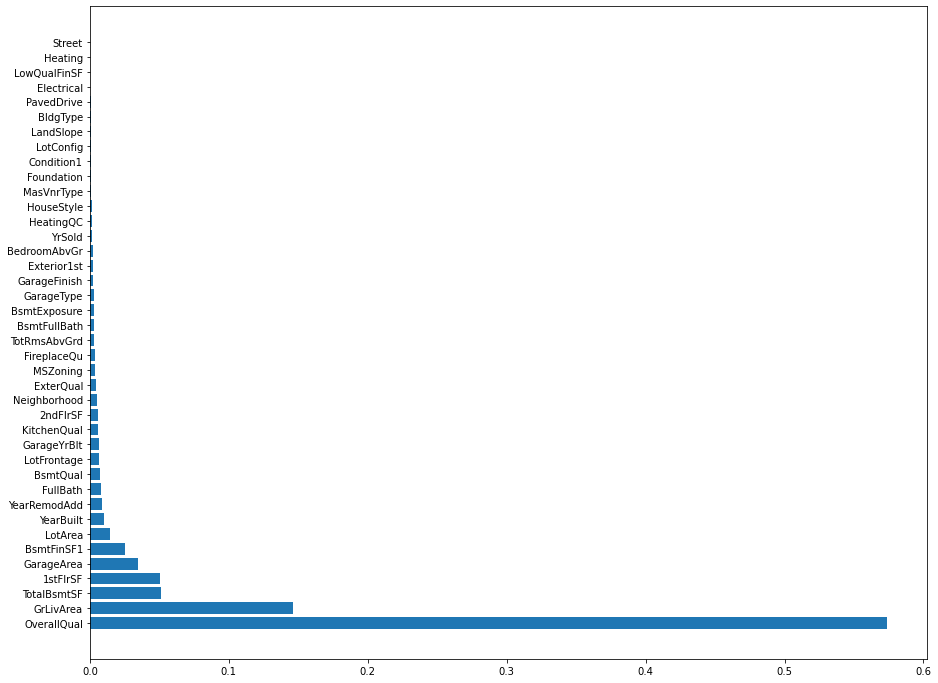

In [56]:
features, importance = zip(*sorted(feature_importance, key=lambda imp: imp[1], reverse=True))
plt.figure(figsize=(15,12))
plt.barh(features, importance)

In [59]:
# 2nd GridSearch 
# set the parameter grid
grid_para_forest = {
    'criterion': ['mse'], 
    'max_depth': [11], #use min_samples_split instead of setting value to max_depth 
    'n_estimators': [300, 350, 400, 450, 500], #   
    'bootstrap':[True],
    'max_features': [2,6,15,30]   #changed from default of 40 in 1st GridSearch to this.  BEAT TO DEATH 1st 
}

# {'bootstrap': True, 'criterion': 'mse', 'max_depth': 11, 'n_estimators': 400}

# use min_samples_split instead of setting value to max_depth. Because 1st GridSearch best_param for max_depth = 11. 
# no need to venture further than 11 because our # of observation is 2580 (2 to the power of (11-12))
# NEXT UP 'min_samples_split': [2, 12, 25, 37 ,50] in place of max_depth

In [60]:
# run the RF regressor through the grid search 
grid_search_forest = ms.GridSearchCV(
    randomForest, grid_para_forest, cv=5, n_jobs=-1, return_train_score=True)
%time grid_search_forest.fit(x_train, np.ravel(y_train))   # %time     is ipython magic command to measure the execution time

Wall time: 45.5 s


GridSearchCV(cv=5, estimator=RandomForestRegressor(random_state=0), n_jobs=-1,
             param_grid={'bootstrap': [True], 'criterion': ['mse'],
                         'max_depth': [11], 'max_features': [2, 6, 15, 30],
                         'n_estimators': [300, 350, 400, 450, 500]},
             return_train_score=True)

In [67]:
# get the best parameters
grid_search_forest.best_params_

{'bootstrap': True,
 'criterion': 'mse',
 'max_depth': 11,
 'max_features': 15,
 'n_estimators': 490}

In [68]:
# get the best score
grid_search_forest.best_score_

# 1st grid score: 0.9014557174136119

0.9080519756155642

In [69]:
# get the training/test scores
print("The R2 training is: %.5f" % (grid_search_forest.best_estimator_.score(x_train, y_train))) 
print("The R2 test     is: %.5f" % (grid_search_forest.best_estimator_.score(x_test, y_test)))

# WITHOUT GRID SEARCH
# The training R2 is: 0.98715
# The test R2 is: 0.84646

# AFTER 1st GRID SEARCH
# The R2 training is: 0.98309
# The R2 test     is: 0.85026

# AFTER 2nd GRID SEARCH
# The R2 training is: 0.98305
# The R2 test     is: 0.86154


The R2 training is: 0.98304
The R2 test     is: 0.86137


In [72]:
# 3rd GridSearch 
# set the parameter grid
grid_para_forest = {
    'criterion': ['mse'], 
    'max_depth' : [11], 
    'n_estimators': [450, 500, 550, 600], # previous: n_estimators': [300, 350, 400, 450, 500]. next:
    'bootstrap':[True],
    'max_features': [15] #next[7,11,15,19,23] # previous: 'max_features': [2,6,15,30] 
}  

# {'bootstrap': True,
#  'criterion': 'mse',
#  'max_depth': 11,
#  'max_features': 15,
#  'n_estimators': 450}

In [73]:
# run the RF regressor through the grid search 
grid_search_forest = ms.GridSearchCV(
    randomForest, grid_para_forest, cv=5, n_jobs=-1, return_train_score=True)
%time grid_search_forest.fit(x_train, np.ravel(y_train))   # %time     is ipython magic command to measure the execution time

Wall time: 17.8 s


GridSearchCV(cv=5, estimator=RandomForestRegressor(random_state=0), n_jobs=-1,
             param_grid={'bootstrap': [True], 'criterion': ['mse'],
                         'max_depth': [11], 'max_features': [15],
                         'n_estimators': [450, 500, 550, 600]},
             return_train_score=True)

In [74]:
# get the best parameters
grid_search_forest.best_params_

{'bootstrap': True,
 'criterion': 'mse',
 'max_depth': 11,
 'max_features': 15,
 'n_estimators': 600}

In [75]:
# get the best score
grid_search_forest.best_score_

# 2nd grid best score: 0.9080486893885352
# previous 3rd grid search 0.9080519756155642

0.9082107661196662

In [76]:
# get the training/test scores
print("The R2 training is: %.5f" % (grid_search_forest.best_estimator_.score(x_train, y_train))) 
print("The R2 test     is: %.5f" % (grid_search_forest.best_estimator_.score(x_test, y_test)))

# WITHOUT GRID SEARCH
# The training R2 is: 0.98715
# The test R2 is: 0.84646

# AFTER 1st GRID SEARCH
# The R2 training is: 0.98309
# The R2 test     is: 0.85026

# AFTER 2nd GRID SEARCH
# The R2 training is: 0.98305
# The R2 test     is: 0.86154

# AFTER 3rd GRID SEARCH
# The R2 training is: 0.98302
# The R2 test     is: 0.86237

The R2 training is: 0.98302
The R2 test     is: 0.86237


In [77]:
# 4th GridSearch 
# set the parameter grid
grid_para_forest = {
    'criterion': ['mse'], 
    'max_depth' : [11], 
    'n_estimators': [550, 600, 650, 700], # previous: n_estimators': [300, 350, 400, 450, 500]. next:
    'bootstrap':[True],
    'max_features': [15] #next[7,11,15,19,23] # previous: 'max_features': [2,6,15,30] 
}  

# previous:
# {'bootstrap': True,
#  'criterion': 'mse',
#  'max_depth': 11,
#  'max_features': 11,
#  'n_estimators': 450}

In [78]:
# run the RF regressor through the grid search 
grid_search_forest = ms.GridSearchCV(
    randomForest, grid_para_forest, cv=5, n_jobs=-1, return_train_score=True)
%time grid_search_forest.fit(x_train, np.ravel(y_train))   # %time     is ipython magic command to measure the execution time

Wall time: 18.4 s


GridSearchCV(cv=5, estimator=RandomForestRegressor(random_state=0), n_jobs=-1,
             param_grid={'bootstrap': [True], 'criterion': ['mse'],
                         'max_depth': [11], 'max_features': [15],
                         'n_estimators': [550, 600, 650, 700]},
             return_train_score=True)

In [79]:
# get the best parameters
grid_search_forest.best_params_

{'bootstrap': True,
 'criterion': 'mse',
 'max_depth': 11,
 'max_features': 15,
 'n_estimators': 600}

In [80]:
# get the best score
grid_search_forest.best_score_

# 3rd grid best score: 0.9082107661196662

0.9082107661196662

In [82]:
# get the training/test scores
print("The R2 training is: %.5f" % (grid_search_forest.best_estimator_.score(x_train, y_train))) 
print("The R2 test     is: %.5f" % (grid_search_forest.best_estimator_.score(x_test, y_test)))

# WITHOUT GRID SEARCH
# The training R2 is: 0.98715
# The test R2 is: 0.84646

# AFTER 1st GRID SEARCH
# The R2 training is: 0.98309
# The R2 test     is: 0.85026

# AFTER 2nd GRID SEARCH
# The R2 training is: 0.98305
# The R2 test     is: 0.86154

# AFTER 3rd GRID SEARCH
# The R2 training is: 0.98302
# The R2 test     is: 0.86237

# AFTER 4th GRID SEARCH - No score improvement so we have found the optimal to be 'n_estimators': 600
# The R2 training is: 0.98302
# The R2 test     is: 0.86237


The R2 training is: 0.98302
The R2 test     is: 0.86237


In [96]:
# 5th GridSearch 
# set the parameter grid
grid_para_forest = {
    'criterion': ['mse'], 
    'max_depth' : [11], 
    'n_estimators': [600], # previous: n_estimators': [300, 350, 400, 450, 500]. next:[410, 430, 450, 470, 490]
    'bootstrap':[True],
    'max_features': [15]  # previous grids :15 since 2nd grid-original: [2,6,15,30]
}   

#The 5th GridSearch best_param for min_samples_split returned 14 resulted in better test R2.  so we want to go to 14 

In [97]:
# run the RF regressor through the grid search 
grid_search_forest = ms.GridSearchCV(
    randomForest, grid_para_forest, cv=5, n_jobs=-1, return_train_score=True)
%time grid_search_forest.fit(x_train, np.ravel(y_train))   # %time     is ipython magic command to measure the execution time

Wall time: 6.95 s


GridSearchCV(cv=5, estimator=RandomForestRegressor(random_state=0), n_jobs=-1,
             param_grid={'bootstrap': [True], 'criterion': ['mse'],
                         'max_depth': [11], 'max_features': [15],
                         'n_estimators': [600]},
             return_train_score=True)

In [98]:
# get the best parameters
grid_search_forest.best_params_


{'bootstrap': True,
 'criterion': 'mse',
 'max_depth': 11,
 'max_features': 15,
 'n_estimators': 600}

In [99]:
# get the best score
grid_search_forest.best_score_

# 4th grid best score: 0.9088813612965737

0.9082107661196662

In [101]:
# get the training/test scores
print("The R2 training is: %.5f" % (grid_search_forest.best_estimator_.score(x_train, y_train))) 
print("The R2 test     is: %.5f" % (grid_search_forest.best_estimator_.score(x_test, y_test)))

# WITHOUT GRID SEARCH
# The training R2 is: 0.98715
# The test R2 is: 0.84646

# AFTER 1st GRID SEARCH
# The R2 training is: 0.98309
# The R2 test     is: 0.85026

# AFTER 2nd GRID SEARCH
# The R2 training is: 0.98305
# The R2 test     is: 0.86154

# AFTER 3rd GRID SEARCH
# The R2 training is: 0.98302
# The R2 test     is: 0.86237

# AFTER 4th GRID SEARCH - No score improvement so we have found the optimal to be 'n_estimators': 600
# The R2 training is: 0.98302
# The R2 test     is: 0.86237

# AFTER 5th GRID SEARCH -No score improvement so we have found the optimal to be 'max_features': 15
# The R2 training is: 0.98302
# The R2 test     is: 0.86237


The R2 training is: 0.98302
The R2 test     is: 0.86237


***************************************************************

In [102]:
# 6th GridSearch 
# set the parameter grid
grid_para_forest = {
    'criterion': ['mse'], 
    'min_samples_split': [2, 12, 25, 37 ,50],
    'n_estimators': [600], # previous: n_estimators': [300, 350, 400, 450, 500]. next:[410, 430, 450, 470, 490]
    'bootstrap':[True],
    'max_features': [15]  # previous grids :15 since 2nd grid-original: [2,6,15,30]
}    

#The 5th GridSearch best_param for min_samples_split returned 14 resulted in better test R2.  so we want to go to 14 

In [103]:
# run the RF regressor through the grid search 
grid_search_forest = ms.GridSearchCV(
    randomForest, grid_para_forest, cv=5, n_jobs=-1, return_train_score=True)
%time grid_search_forest.fit(x_train, np.ravel(y_train))   # %time     is ipython magic command to measure the execution time

Wall time: 19.4 s


GridSearchCV(cv=5, estimator=RandomForestRegressor(random_state=0), n_jobs=-1,
             param_grid={'bootstrap': [True], 'criterion': ['mse'],
                         'max_features': [15],
                         'min_samples_split': [2, 12, 25, 37, 50],
                         'n_estimators': [600]},
             return_train_score=True)

In [104]:
# get the best parameters
grid_search_forest.best_params_


{'bootstrap': True,
 'criterion': 'mse',
 'max_features': 15,
 'min_samples_split': 2,
 'n_estimators': 600}

In [107]:
# get the best score
grid_search_forest.best_score_

# 5th grid best score: 0.9082107661196662

0.9097044155170402

In [109]:
# get the training/test scores
print("The R2 training is: %.5f" % (grid_search_forest.best_estimator_.score(x_train, y_train))) 
print("The R2 test     is: %.5f" % (grid_search_forest.best_estimator_.score(x_test, y_test)))

# WITHOUT GRID SEARCH
# The training R2 is: 0.98715
# The test R2 is: 0.84646

# AFTER 1st GRID SEARCH
# The R2 training is: 0.98309
# The R2 test     is: 0.85026

# AFTER 2nd GRID SEARCH
# The R2 training is: 0.98305
# The R2 test     is: 0.86154

# AFTER 3rd GRID SEARCH
# The R2 training is: 0.98302
# The R2 test     is: 0.86237

# AFTER 4th GRID SEARCH - No score improvement so we have found the optimal to be 'n_estimators': 600
# The R2 training is: 0.98302
# The R2 test     is: 0.86237

# AFTER 5th GRID SEARCH -No score improvement so we have found the optimal to be 'max_features': 15
# The R2 training is: 0.98302
# The R2 test     is: 0.86237

# AFTER 6th GRID SEARCH 
# The R2 training is: 0.98814
# The R2 test     is: 0.86301

The R2 training is: 0.98814
The R2 test     is: 0.86301


In [110]:
# 7th GridSearch 
# set the parameter grid
grid_para_forest = {
    'criterion': ['mse'], 
    'min_samples_split': [2, 4, 6],
    'n_estimators': [600], # previous: n_estimators': [300, 350, 400, 450, 500]. next:[410, 430, 450, 470, 490]
    'bootstrap':[True],
    'max_features': [15]  # previous grids :15 since 2nd grid-original: [2,6,15,30]
}  


In [111]:
# run the RF regressor through the grid search 
grid_search_forest = ms.GridSearchCV(
    randomForest, grid_para_forest, cv=5, n_jobs=-1, return_train_score=True)
%time grid_search_forest.fit(x_train, np.ravel(y_train))   # %time     is ipython magic command to measure the execution time

Wall time: 18.1 s


GridSearchCV(cv=5, estimator=RandomForestRegressor(random_state=0), n_jobs=-1,
             param_grid={'bootstrap': [True], 'criterion': ['mse'],
                         'max_features': [15], 'min_samples_split': [2, 4, 6],
                         'n_estimators': [600]},
             return_train_score=True)

In [112]:
# get the best parameters
grid_search_forest.best_params_


{'bootstrap': True,
 'criterion': 'mse',
 'max_features': 15,
 'min_samples_split': 2,
 'n_estimators': 600}

In [113]:
# get the best score
grid_search_forest.best_score_

#6th best score: 0.9087565804919022

0.9097044155170402

In [114]:
# get the training/test scores
print("The R2 training is: %.5f" % (grid_search_forest.best_estimator_.score(x_train, y_train))) 
print("The R2 test     is: %.5f" % (grid_search_forest.best_estimator_.score(x_test, y_test)))

# WITHOUT GRID SEARCH
# The training R2 is: 0.98715
# The test R2 is: 0.84646

# AFTER 1st GRID SEARCH
# The R2 training is: 0.98309
# The R2 test     is: 0.85026

# AFTER 2nd GRID SEARCH
# The R2 training is: 0.98305
# The R2 test     is: 0.86154

# AFTER 3rd GRID SEARCH
# The R2 training is: 0.98217
# The R2 test     is: 0.86180

# AFTER 4th GRID SEARCH - No score improvement so we have found the optimal to be 'max_features': 20
# The R2 training is: 0.98237
# The R2 test     is: 0.86217

# AFTER 5th GRID SEARCH
# The R2 training is: 0.98273
# The R2 test     is: 0.86338

#AFTER 6th GRID SEARCH
# The R2 training is: 0.98275
# The R2 test     is: 0.86345

#AFTER 7th GRID SEARCH - we stop hyperparameter tuning because the scores are not increasing anymore.  
# The R2 training is: 0.98275
# The R2 test     is: 0.86345 

# WITHOUT GRID SEARCH
# The training R2 is: 0.98715
# The test R2 is: 0.84646


The R2 training is: 0.98814
The R2 test     is: 0.86301


In [112]:
# (3)What's the first 5 important features? Again please plot the sorted feature scores by barh
tree_final = grid_search_forest.best_estimator_
feature_importance = list(zip(x_train.columns, tree_final.feature_importances_))
sorted(feature_importance, key=lambda imp: imp[1], reverse=True)

[('OverallQual', 0.25829331406986406),
 ('GrLivArea', 0.13380966693959043),
 ('ExterQual', 0.09764864613951942),
 ('GarageArea', 0.07133185065473574),
 ('YearBuilt', 0.06769036072679688),
 ('TotalBsmtSF', 0.061486027604483635),
 ('1stFlrSF', 0.05040034600174969),
 ('BsmtQual', 0.04139045443674918),
 ('KitchenQual', 0.03437675102309641),
 ('BsmtFinSF1', 0.025403139527693196),
 ('LotArea', 0.020606602433719954),
 ('2ndFlrSF', 0.017422004737451147),
 ('GarageYrBlt', 0.016034545081876628),
 ('FireplaceQu', 0.015961829420709887),
 ('FullBath', 0.014858304016606032),
 ('YearRemodAdd', 0.009607424648401796),
 ('LotFrontage', 0.008904261383313638),
 ('TotRmsAbvGrd', 0.00801742383139982),
 ('Neighborhood', 0.006047867624131488),
 ('GarageType', 0.005581115118780002),
 ('GarageFinish', 0.00406603940928742),
 ('BsmtExposure', 0.0038708179303532926),
 ('BsmtFullBath', 0.003835289612409371),
 ('BedroomAbvGr', 0.003749236443903732),
 ('Exterior1st', 0.0027663266059642375),
 ('MSZoning', 0.0024604595

<BarContainer object of 40 artists>

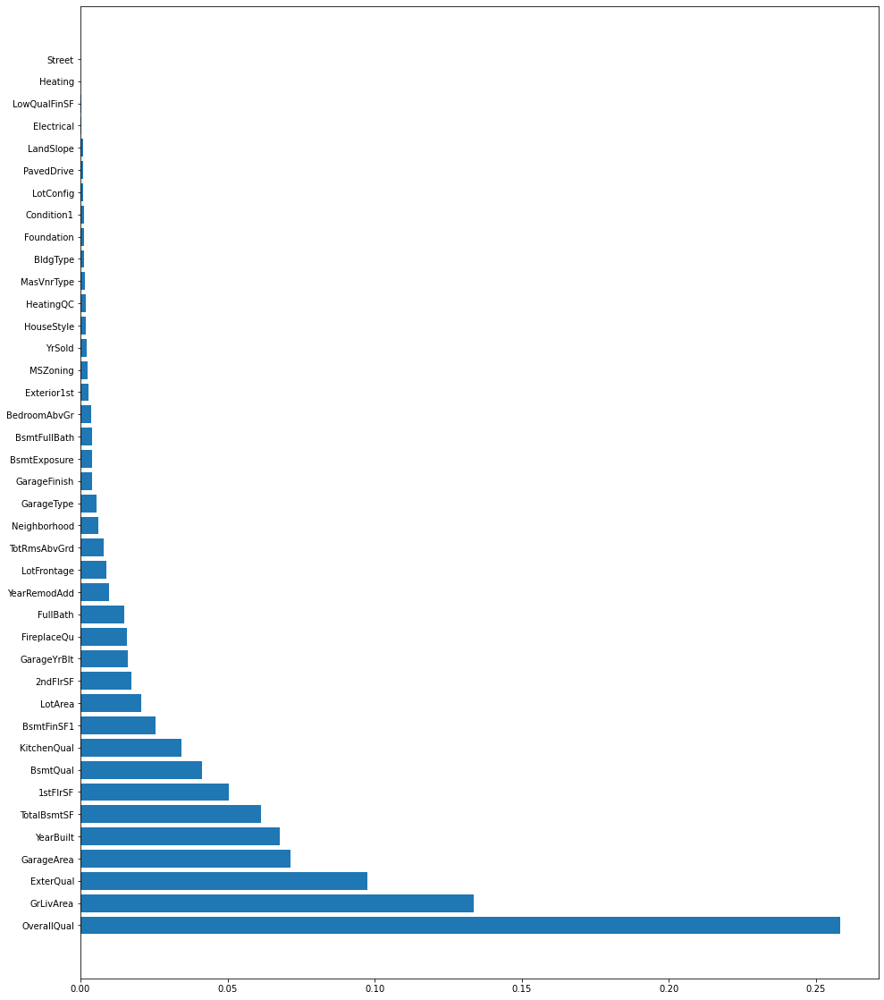

In [113]:
features, importance = zip(*sorted(feature_importance, key=lambda imp: imp[1], reverse=True))
plt.figure(figsize=(16,20))
plt.barh(features, importance)

In [114]:
features = housing_encoded.drop(['SalePrice'], axis=1)
features.head()


,GrLivArea,LotFrontage,LotArea,OverallQual,YearBuilt,YearRemodAdd,BsmtFinSF1,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,BsmtFullBath,FullBath,BedroomAbvGr,TotRmsAbvGrd,GarageYrBlt,GarageArea,YrSold,MSZoning,Street,LotConfig,Neighborhood,Condition1,BldgType,HouseStyle,Exterior1st,MasVnrType,Foundation,Heating,GarageType,LandSlope,ExterQual,BsmtQual,BsmtExposure,HeatingQC,Electrical,KitchenQual,FireplaceQu,GarageFinish,PavedDrive
1,856,59.0,7890,6,1939,1950,238.0,856.0,856,0,0,1.0,1,2,4,1939.0,399.0,2010,5,1,0,21,2,0,2,13,3,1,1,5,1,3,4,2,3,5,3,5,2,3
2,1049,42.0,4235,5,1984,1984,552.0,1049.0,1049,0,0,1.0,2,2,5,1984.0,266.0,2009,5,1,4,7,2,4,2,6,1,1,1,1,1,4,5,3,3,5,4,1,4,3
3,1001,60.0,6060,5,1930,2007,737.0,837.0,1001,0,0,0.0,1,2,5,1930.0,216.0,2007,1,1,4,11,2,0,2,8,3,0,1,5,1,4,4,2,5,5,4,1,2,1
4,1039,80.0,8146,4,1900,2003,0.0,405.0,717,322,0,0.0,1,2,6,1940.0,281.0,2009,5,1,0,20,2,0,5,8,3,0,1,5,1,4,3,2,4,5,3,1,2,1
5,1665,70.0,8400,8,2001,2001,643.0,810.0,810,855,0,1.0,2,3,6,2001.0,528.0,2009,5,1,4,17,2,0,5,12,3,2,1,1,1,4,5,2,5,5,4,1,4,3


In [132]:
features1 = features.drop(['Electrical','LowQualFinSF','Heating','Street'], axis=1) 
features1.shape

(2580, 36)

In [133]:
x_train = features1.iloc[train_idx]
x_test = features1.iloc[test_idx]
y_train = target.iloc[train_idx]
y_test = target.iloc[test_idx]

In [134]:
# (1)
from sklearn.ensemble import RandomForestRegressor
randomForest = RandomForestRegressor()

# fit RF model on training set 
randomForest.set_params(random_state=0)
randomForest.fit(x_train, np.ravel(y_train)) 

RandomForestRegressor(random_state=0)

In [135]:
randomForest.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'criterion': 'mse',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 0,
 'verbose': 0,
 'warm_start': False}

In [136]:
print("The training R2 is: %.5f" % (randomForest.score(x_train, y_train)))
print("The test R2 is: %.5f" % (randomForest.score(x_test, y_test)))

The training R2 is: 0.98718
The test R2 is: 0.84611


In [137]:
from sklearn.ensemble import RandomForestRegressor
randomForest = RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=11, max_features=14, n_estimators=490)

# fit RF model on training set 
randomForest.set_params(random_state=0)
randomForest.fit(x_train, np.ravel(y_train)) 

RandomForestRegressor(max_depth=11, max_features=14, n_estimators=490,
                      random_state=0)

In [138]:
print("The training R2 is: %.5f" % (randomForest.score(x_train, y_train)))
print("The test R2 is: %.5f" % (randomForest.score(x_test, y_test)))

#training 0.98275
#test 0.86345 

The training R2 is: 0.98312
The test R2 is: 0.86114


In [ ]:
#BECAUSE REMOVING THE LEAST IMPORTANT 4 FEATURES LOWERED R2 SCORES, WE DECIDE TO KEEP ALL 40 FEATURES 

In [141]:
x_train = features.iloc[train_idx]
x_test = features.iloc[test_idx]
y_train = target.iloc[train_idx]
y_test = target.iloc[test_idx]

In [155]:
actual_y = y_test

In [156]:
from sklearn.ensemble import RandomForestRegressor
randomForestPlot = RandomForestRegressor(
    bootstrap=True, criterion='mse', max_depth=11, max_features=14, n_estimators=490)

# fit RF model on training set 
randomForestPlot.set_params(random_state=0)
randomForestPlot.fit(x_train, np.ravel(y_train))

RandomForestRegressor(max_depth=11, max_features=14, n_estimators=490,
                      random_state=0)

In [157]:
randomForestPlot.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'criterion': 'mse',
 'max_depth': 11,
 'max_features': 14,
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 490,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 0,
 'verbose': 0,
 'warm_start': False}

In [158]:
#Predicted Price from test dataset w.r.t Random Forest Regression
predict_y = randomForestPlot.predict((x_test))

In [159]:
predict_y=pd.DataFrame(predict_y)
type(predict_y)

pandas.core.frame.DataFrame

In [160]:
actual_y=pd.DataFrame(actual_y)
type(actual_y)

pandas.core.frame.DataFrame

In [169]:
actual_y=actual_y.reset_index()

In [173]:
actual_y=actual_y.drop("index", axis=1)

In [175]:
actual_y.head()

,SalePrice
0,173000
1,115000
2,172500
3,155000
4,124500


In [177]:
splot = pd.concat([actual_y, predict_y], axis=1)

splot.columns = ['actual house price', 'predicted house price']
splot.head()

,actual house price,predicted house price
0,173000,165825.226715
1,115000,103980.418463
2,172500,167562.956895
3,155000,156788.312176
4,124500,111508.772083


<AxesSubplot:xlabel='actual house price', ylabel='predicted house price'>

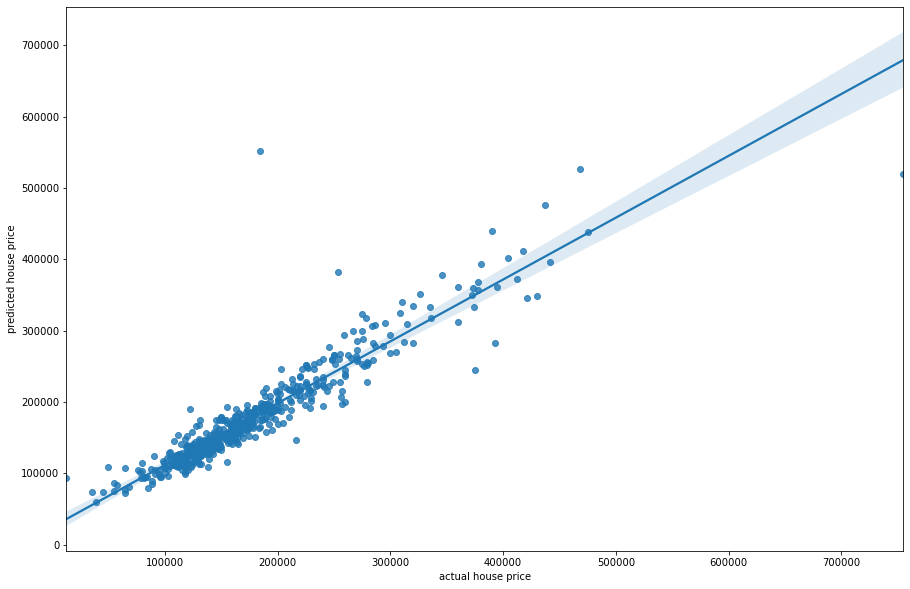

In [178]:
f, ax = plt.subplots(figsize=(15, 10))
sns.regplot(x='actual house price', y='predicted house price', data=splot, ax=ax)

In [184]:
import math
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(actual_y, predict_y)
rmse = math.sqrt(mse) 
print(rmse) 

28464.03089489709


In [168]:
housing.groupby("Neighborhood")["SalePrice"].mean().round()

Neighborhood
Blmngtn    196237.0
Blueste    143590.0
BrDale     106095.0
BrkSide    126030.0
ClearCr    213981.0
CollgCr    198133.0
Crawfor    201989.0
Edwards    133152.0
Gilbert    189440.0
Greens     193531.0
GrnHill    280000.0
IDOTRR     108103.0
Landmrk    137000.0
MeadowV     96836.0
Mitchel    162655.0
NAmes      145087.0
NPkVill    140743.0
NWAmes     190372.0
NoRidge    326114.0
NridgHt    313662.0
OldTown    126939.0
SWISU      133576.0
Sawyer     137493.0
SawyerW    188102.0
Somerst    228762.0
StoneBr    305308.0
Timber     242910.0
Veenker    251263.0
Name: SalePrice, dtype: float64

In [169]:
housing.shape

(2580, 41)

In [170]:
import requests
import urllib.parse

address = '420 Beach Ave Ames, IA 50011'
url = 'https://nominatim.openstreetmap.org/search/' + urllib.parse.quote(address) +'?format=json'

response = requests.get(url).json()
print(response[0]["lat"])
print(response[0]["lon"]) 

42.018929905827875
-93.63931486829888
